# <strong> 1. Business Understanding 


### 1.1 Context
In recent years, Bangkok has emerged as a top global tourist destination, attracting travelers with its vibrant culture, historic landmarks, and dynamic nightlife. The city's tourism boom has fueled the growth of alternative accommodation platforms like Airbnb, which offers diverse lodging options beyond traditional hotels. From budget rooms to luxury apartments, these listings cater to a broad spectrum of travelers, making the city's tourism sector more inclusive and accessible.

However, with thousands of listings across the city, there is significant competition among hosts, and understanding market dynamics becomes essential. Pricing strategies, guest preferences, and geographical demand distribution are some factors that hosts need to consider to optimize their listings for maximum occupancy and profitability.

### 1.2 Problem Statement
Despite the availability of extensive data on listings, many hosts on Airbnb may not have the tools or understanding to utilize this information, potentially leading to suboptimal pricing, lower occupancy rates, or overlooked opportunities for service differentiation. There is a need to analyze the current market conditions, understand the factors that influence rental prices, and identify patterns or trends that could inform smarter business decisions for property owners and investors in the Airbnb market.

### 1.3 Goals
* Analyze the data to understand the pricing trends across different neighborhoods and for various types of accommodations.
* Identify underserved or emerging markets within Bangkok where there is potential for higher returns on investment.
* Understand guest preferences in terms of accommodation types, locations, and amenities.

### 1.4 Stakeholders
* Property Hosts/Owners: Interested in maximizing their revenue and occupancy rates. They need insights to optimize their listings, pricing, and guest experience strategies.
* Airbnb Management/Marketing Teams: Require market intelligence to tailor their platform features, marketing strategies, and support services for hosts and guests in the region. 
* Investors/Real Estate Developers: Looking for investment opportunities and understanding market trends in the hospitality sector of Bangkok. 



# <strong> 2. Data Preparation

In [321]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json

from scipy.stats import normaltest

import warnings
warnings.filterwarnings("ignore")

data = pd.read_csv('Airbnb_listings_Bangkok.csv')
#data


In [322]:
data.copy()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,NaN,NaN,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0


There are top 5 data of the dataset:

In [323]:
display(data.head(),data.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


In [324]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

# <strong> 3. Data Understanding


__The dataset contains information about various Airbnb listings in Bangkok. There are 16 columns in the dataset:__

* Unnamed: 0: Appears to be a redundant index. <br>
* id: The unique identifier for the listing.<br>
* name: The title or name given to the property listing.<br>
* host_id: The unique identifier for the host.<br>
* host_name: The name of the host.<br>
* neighbourhood: The area or locality of the property.<br>
* latitude and longitude: Geographic coordinates of the property.<br>
* room_type: Type of property (e.g., Entire home/apt, Private room).<br>
* price: Listed price for renting the property.<br>
* minimum_nights: Minimum number of nights a guest can stay.<br>
* number_of_reviews: The total number of reviews for the property.<br>
* last_review: The date of the latest review.<br>
* reviews_per_month: Average number of reviews per month.<br>
* calculated_host_listings_count: The number of listings the host has in total.<br>
* availability_365: Number of days the property is available throughout the year.<br>
* number_of_reviews_ltm: Number of reviews in the last twelve months.<br>

In [325]:
data['last_review'] = pd.to_datetime(data['last_review'])

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Unnamed: 0                      15854 non-null  int64         
 1   id                              15854 non-null  int64         
 2   name                            15846 non-null  object        
 3   host_id                         15854 non-null  int64         
 4   host_name                       15853 non-null  object        
 5   neighbourhood                   15854 non-null  object        
 6   latitude                        15854 non-null  float64       
 7   longitude                       15854 non-null  float64       
 8   room_type                       15854 non-null  object        
 9   price                           15854 non-null  int64         
 10  minimum_nights                  15854 non-null  int64         
 11  nu

converts a column named 'last_review' in a dataset to a format that represents dates and times.

In [326]:
data.isna().sum()

Unnamed: 0                           0
id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

The columns 'name,' 'host_name,' 'last_review,' and 'reviews_per_month' have missing values.
'last_review' and 'reviews_per_month' have a substantial number of missing values (5790), indicating that a significant portion of the data for these columns is not available.

In [327]:
display(data.describe(), data.describe(include='object'))

,Unnamed: 0,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,15854.000000,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064,10064.000000,15854.000000,15854.000000,15854.000000
mean,7926.500000,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,2021-08-30 08:37:49.316375296,0.813145,13.889618,244.378643,3.481519
min,0.000000,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,2012-12-15 00:00:00,0.010000,1.000000,0.000000,0.000000
25%,3963.250000,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,2020-02-20 00:00:00,0.120000,1.000000,138.000000,0.000000
50%,7926.500000,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,2022-10-24 00:00:00,0.435000,4.000000,309.000000,0.000000
75%,11889.750000,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,2022-12-08 00:00:00,1.060000,13.000000,360.000000,3.000000
max,15853.000000,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,2022-12-28 00:00:00,19.130000,228.000000,365.000000,325.000000
std,4576.799919,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,NaN,1.090196,30.269848,125.843224,8.916937


,name,host_name,neighbourhood,room_type
count,15846,15853,15854,15854
unique,14794,5312,50,4
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt
freq,45,228,2153,8912


In [328]:
pd.DataFrame({
    'feature'           : data.columns.values,
    'data_type'         : data.dtypes.values,
    'null_value(%)'     : data.isna().mean().values * 100,
    'n_unique'          : data.nunique().values,
    'duplicate'         : data.duplicated().sum(),
    'Negative_value_num': [len(data[col][data[col] < 0])/ len(data) * 100 if col in data.select_dtypes(include=np.number).columns else 0 for col in data.columns],
    'Zero_value_num'    : [len(data[col][data[col] == 0])/ len(data) * 100 if col in data.select_dtypes(include=np.number).columns else 0 for col in data.columns],
    'Zero_value_obj'    : [len(data[col][data[col] == ''])/ len(data) * 100 if col in data.select_dtypes(include=np.object_).columns else 0 for col in data.columns],
    'sample_unique'     : [data[col].unique() for col in data.columns]}
).round(3)

,feature,data_type,null_value(%),n_unique,duplicate,Negative_value_num,Zero_value_num,Zero_value_obj,sample_unique
0,Unnamed: 0,int64,0.000,15854,0,0.0,0.006,0.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,id,int64,0.000,15854,0,0.0,0.000,0.0,"[27934, 27979, 28745, 35780, 941865, 1704776, ..."
2,name,object,0.050,14794,0,0.0,0.000,0.0,"[Nice room with superb city view, Easy going l..."
3,host_id,int64,0.000,6659,0,0.0,0.000,0.0,"[120437, 120541, 123784, 153730, 610315, 21296..."
4,host_name,object,0.006,5312,0,0.0,0.000,0.0,"[Nuttee, Emy, Familyroom, Sirilak, Kasem, Wimo..."
5,neighbourhood,object,0.000,50,0,0.0,0.000,0.0,"[Ratchathewi, Bang Na, Bang Kapi, Din Daeng, B..."
6,latitude,float64,0.000,9606,0,0.0,0.000,0.0,"[13.75983, 13.66818, 13.75232, 13.78823, 13.76..."
7,longitude,float64,0.000,10224,0,0.0,0.000,0.0,"[100.54134, 100.61674, 100.62402, 100.57256, 1..."
8,room_type,object,0.000,4,0,0.0,0.000,0.0,"[Entire home/apt, Private room, Hotel room, Sh..."
9,price,int64,0.000,3040,0,0.0,0.006,0.0,"[1905, 1316, 800, 1286, 1000, 1558, 1461, 700,..."


###  <strong> 4. Data Cleaning

#### <Strong> 4.1 Drop Unneeded Column

In [329]:
display(data['id'].nunique())
data.shape

15854

(15854, 17)

In [330]:
data = data.drop(columns='Unnamed: 0')
data

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,NaT,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,NaT,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,NaT,NaN,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaT,NaN,1,362,0
15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaT,NaN,14,365,0
15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaT,NaN,14,365,0
15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaT,NaN,14,365,0


Since we don't need Unnamed: 0 column, we will drop it.

### 4.2 Duplicated Data

In [331]:
# Checking for duplicated rows in the dataset
duplicated_rows = data.duplicated()
num_duplicated_rows = duplicated_rows.sum()

num_duplicated_rows


0

There is no duplicated data in the dataset

### <Strong> 4.3 Missing Value

In [332]:
data.isna().sum()/data.shape[0]*100

id                                 0.000000
name                               0.050460
host_id                            0.000000
host_name                          0.006308
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       36.520752
reviews_per_month                 36.520752
calculated_host_listings_count     0.000000
availability_365                   0.000000
number_of_reviews_ltm              0.000000
dtype: float64

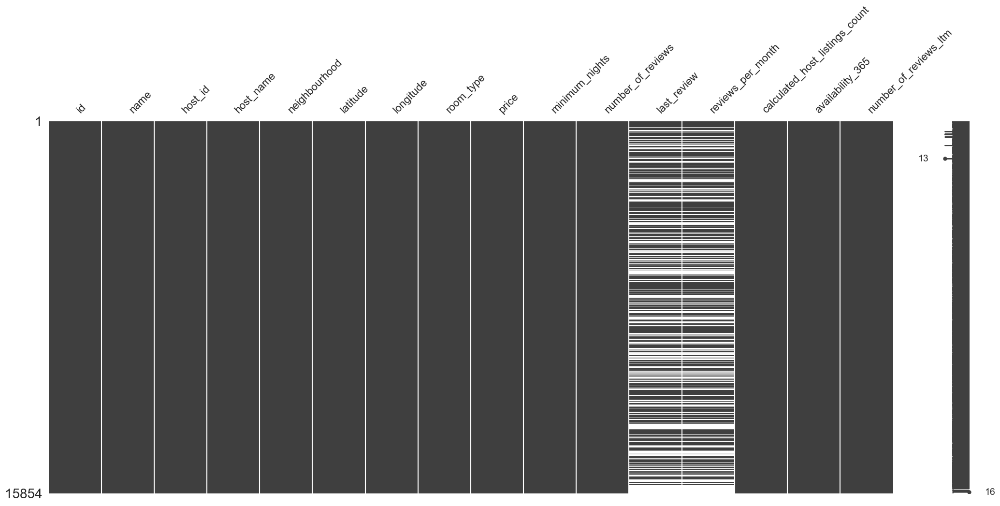

In [333]:
import missingno as msno
import matplotlib.pyplot as plt

msno.matrix(data)
plt.show()

* Missing Value in the coloumn `name` is `0,05%`
* Missing Value in the coloumn `host_name` is `0,0003%`
* Missing Value in the coloumn `last_review` & `reviews_per_month` is `37%`

looks like there is a correlation between `last_review` & `reviews_per_month`, my assumption, if `last_review` is not filled then the `reviews_per_month` will be not filled

##### <strong> 4.3.1 Handle the Missing Value in 'name' Column

In [334]:
# Mengidentifikasi baris di mana kolom 'name' kosong
data[data['name'].isna()]



,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,NaN,1,365,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


There are 8 empty data in the 'name' column. There is 1 host ID with a calculated_host_listings_count of 3. We can assume that this listing has 2 other listings with the same name. For the remaining 7 missing values, there are no common elements that can be used to fill in the empty data.

In [335]:
data[data['host_id']==73275200]

# Found that there is a unfilled name from 73275200 host_id. 
# Assuming that the missing value is Errday Guest House because it has the same host_id.

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,NaN,3,1,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


As we can see here, when we found that the null value from id 13142743 has the same `host_id`

In [336]:
#mengisi kolom name yang kosong berdasarkan host_name yang sama
data['name'].iloc[2075] = 'Errday Guest House'
data[data['host_id']==73275200]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,NaN,3,1,0
2075,13142743,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


So, we fill the null with the same name with 73275200

In [337]:
data[data['name'].isna()]


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,NaN,1,365,0


We can drop the 7 missing values since the missing values are less than 5%.

In [338]:
#Menghapus baris dari ke 7 data missing value
data = data.dropna(subset=['name'])
data.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5784
reviews_per_month                 5784
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

##### <strong> 4.3.2 Handle the Missing Value in 'host_name'

In [339]:
data[data['host_name'].isna()]


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


It can be inferred that these listings are likely inactive, given that the 'availability_365' column indicates a full availability of 365 days, and the most recent review dates back to 2017. Furthermore, for a listing to inspire trust, it should include the owner's name. Hence, the best course of action would be to eliminate these particular listings.

In [340]:
data = data.dropna(subset=['host_name'])
data.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5784
reviews_per_month                 5784
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

##### <strong> 4.3.3 Handle the Missing Value in `last_review` & `review_per_month`

In [341]:
data[data['last_review'].isna() & data['reviews_per_month'].isna()]


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,NaT,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,NaT,NaN,1,365,0
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,NaT,NaN,3,365,0
7,1738669,1 chic bedroom apartment in BKK,7045870,Jiraporn,Chatu Chak,13.829250,100.567370,Entire home/apt,1461,1,0,NaT,NaN,1,365,0
14,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.715160,100.568060,Entire home/apt,1400,30,0,NaT,NaN,1,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaT,NaN,1,362,0
15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaT,NaN,14,365,0
15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaT,NaN,14,365,0
15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaT,NaN,14,365,0


In the 'last_review' column, there are 5784 empty entries. These empty entries are due to the fact that these listings have never received reviews, so the date of the last review is also empty. For these empty data points, we will leave them as they are. The reason is that this column has a datetime data type, and we cannot make assumptions based on information from other columns. Then we will fill the null with 00-00-0000 and 0.

In [342]:
data['last_review'] = data['last_review'].fillna('00-00-0000')
data['reviews_per_month'] = data['reviews_per_month'].fillna(0)

data.isna().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

Finnaly all of the missing value already handled

### 4.4 Outliers

In [343]:
data.describe().columns


Index(['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'],
      dtype='object')

In [344]:
numericals = ['price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
categoricals = ['name','neighbourhood','room_type','last_review']

We split the column between 2 categories, numericals & categoricals

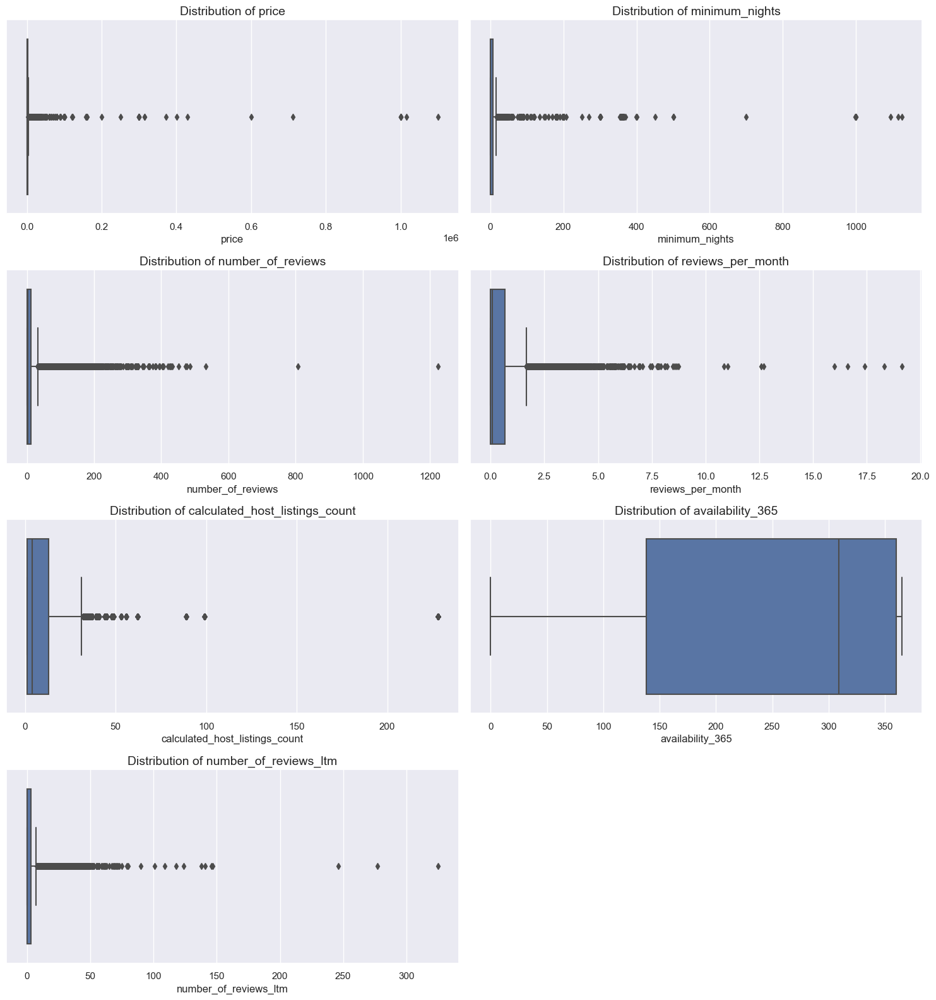

In [345]:
numericals = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
                   'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']

# Set up the matplotlib figure
num_plots = len(numericals)
num_rows = num_plots // 2 + (num_plots % 2 > 0)  # Adjust grid size based on number of plots

f, axes = plt.subplots(num_rows, 2, figsize=(15, 4 * num_rows))  # Adjust the size as needed

# Flatten the axes array and remove extra plots if number of plots is odd
axes = axes.flatten()
for i in range(num_plots, len(axes)):
    f.delaxes(axes[i])

# Create boxplots
for i, col in enumerate(numericals):
    sns.boxplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)

plt.tight_layout()
plt.show()


### 4.4.1 Handle outlier `Price`

There are some outliers in numeric column, but we will handle some of columns which we will use for analysis.

In [346]:
ks_test = stats.kstest(data['price'], 'norm')
ks_test

KstestResult(statistic=0.9999368925911902, pvalue=0.0, statistic_location=278, statistic_sign=-1)

The very low p-value suggests that the data doesn't fit that distribution well

In [347]:
# Attempting the calculation again due to technical issues

# Recalculating the quantiles and IQR
Q1_price = data['price'].quantile(0.25)
Q3_price = data['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price

# Defining the bounds outside of which data points are considered outliers
lower_bound_price = Q1_price - 1.5 * IQR_price
upper_bound_price = Q3_price + 1.5 * IQR_price

# Identifying the outliers
outliers_lower = data['price'] < lower_bound_price
outliers_upper = data['price'] > upper_bound_price
num_outliers_price = data[outliers_lower | outliers_upper].shape[0]

IQR_price, lower_bound_price, upper_bound_price, num_outliers_price


(1529.0, -1393.5, 4722.5, 1402)

 these calculations help identify potential outliers in the 'price' column of the dataset using the IQR method. Data points with prices below -1393.5 or above 4722.5 are considered as potential outliers, and there are 1402 such data points in the dataset. Further analysis can be done to decide how to handle these potential outliers.

In [348]:
data['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Hotel room', 'Shared room'],
      dtype=object)

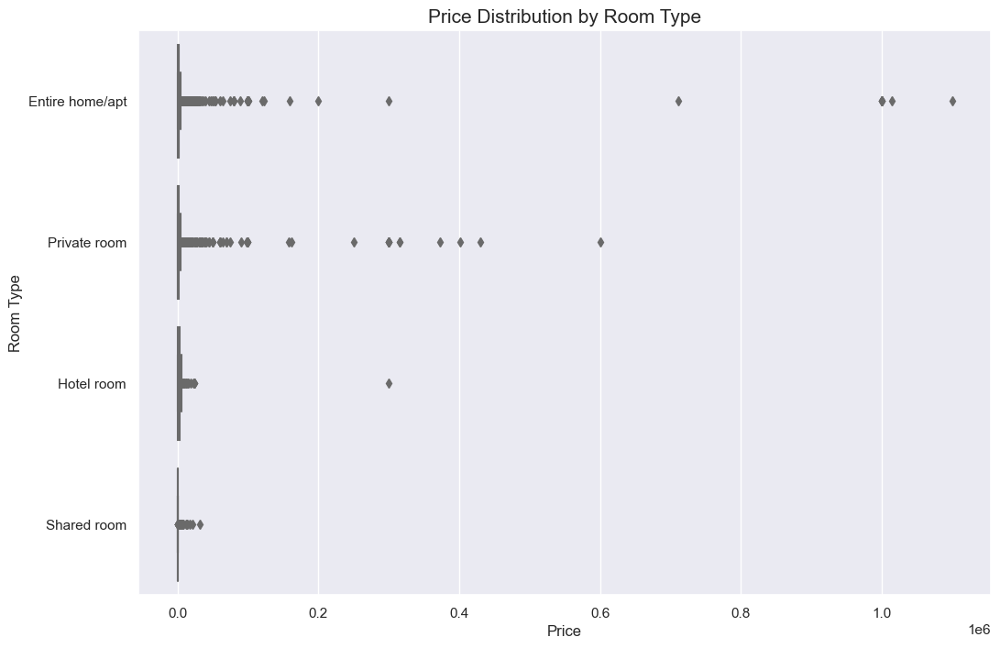

In [349]:
# Create a boxplot for 'price' categorized by 'room_type'
plt.figure(figsize=(12, 8))

# Generate a boxplot
sns.boxplot(x='price', y='room_type', data=data, palette="Set3")

plt.title('Price Distribution by Room Type', fontsize=15)
plt.xlabel('Price', fontsize=12)
plt.ylabel('Room Type', fontsize=12)

plt.show()


We check the outliers based on room type

In [350]:
# cek price pada room type Entire home/apt
price_enthome_data = data[data['room_type']=='Entire home/apt'].sort_values(by='price',ascending=False)
display(price_enthome_data.head(),price_enthome_data.tail())

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
12868,635676064543597376,New 1 bedroom apartment BTS MRT Asoke,12464705,Lucio,Vadhana,13.742186,100.560394,Entire home/apt,1100000,14,0,00-00-0000,0.00,1,365,0
12300,562972065309061724,3B中文No Guest Service Fee@Nana Asok/Soi11 Night...,131427125,Jj,Vadhana,13.746660,100.559100,Entire home/apt,1014758,30,2,2022-09-17 00:00:00,0.32,10,75,2
6289,29909847,BTS轻轨线on nut站，全新一房一厅，临Tesco商场市集!New cozy 1BR,210559448,Cora,Khlong Toei,13.703330,100.592470,Entire home/apt,1000000,2,69,2020-03-12 00:00:00,1.39,6,90,0
1779,11579635,"2 Bedroom,wifi,5mMRT&Shopping Mall",30803267,Yasmine,Huai Khwang,13.754710,100.565980,Entire home/apt,1000000,100,53,2018-02-20 00:00:00,0.64,4,249,0
4620,23740993,"Modern&Luxury apartment,5min to MRT,freeWifi",30803267,Yasmine,Huai Khwang,13.760650,100.568980,Entire home/apt,1000000,1,12,2020-03-24 00:00:00,0.22,4,336,0


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11215,44327659,"Cozy condo, south of Chao Phraya, 100m from BTS",187810737,Lucy,Thon buri,13.72111,100.49285,Entire home/apt,348,360,0,00-00-0000,0.00,1,364,0
9657,40682461,Stay in Bangkok,300906280,อัญชลี,Bang Kapi,13.80165,100.61799,Entire home/apt,346,2,5,2022-11-18 00:00:00,0.18,3,326,4
1481,9465632,Condo near BTS - Bangwa Station,48621743,Joke,Phasi Charoen,13.72089,100.45985,Entire home/apt,346,180,0,00-00-0000,0.00,1,365,0
5246,26251682,Elio Condominium near Sukhumvit Onnut,66095049,Michael,Phra Khanong,13.68707,100.59963,Entire home/apt,337,60,0,00-00-0000,0.00,1,96,0
10222,41914857,#512963 Studio Room Apartment near BTS On-nut,331549426,Kanya,Khlong Toei,13.70473,100.59740,Entire home/apt,332,28,0,00-00-0000,0.00,1,364,0


In [351]:
# cek price pada room type Private room
price_prvroom_data = data[data['room_type']=='Private room'].sort_values(by='price',ascending=False)
display(price_prvroom_data.head(),price_prvroom_data.tail())

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
4373,22633450,rm 1 : cozy & comfy,117057915,Jeab,Bang Phlat,13.79163,100.49038,Private room,600700,1,9,2020-01-26 00:00:00,0.17,5,330,0
11885,52940323,🎗𝘾𝙝𝙚𝙬𝙖𝙩𝙝𝙖𝙞 𝙍𝙖𝙢𝙠𝙝𝙖𝙢𝙝𝙖𝙚𝙣𝙜\nBy KhunGrape,99882630,Jiranuch,Bang Kapi,13.76082,100.63366,Private room,429443,1,0,00-00-0000,0.00,1,313,0
12792,629653142142561774,rm 6 : bright morning sunlight.,117057915,Jeab,Bang Phlat,13.79049,100.48816,Private room,400717,1,0,00-00-0000,0.00,5,241,0
6549,31365769,"WH (container, Double bed, 2ppl -F)",234881965,Napawadee,Khlong Toei,13.73514,100.55217,Private room,372227,1,24,2020-01-27 00:00:00,0.50,4,147,0
6760,31364368,"WH (Container style, twin bed, 2ppl, citycente...",234881965,Napawadee,Khlong Toei,13.73505,100.55239,Private room,314899,1,4,2020-02-24 00:00:00,0.10,4,147,0


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11663,49745793,วิภาแมนชั่น ติดถนนลาดพร้าว83 สะดวกและสบาย,360388789,นิภาวรรรณ,Wang Thong Lang,13.785760,100.614520,Private room,315,120,0,00-00-0000,0.00,1,365,0
7831,34752495,Local life near svarnmbumi airport ; nature,131930129,Gondal,Nong Chok,13.814480,100.835430,Private room,310,1,0,00-00-0000,0.00,1,89,0
8974,38406752,🏡5 mins walk to 🚅 Cozy room in a local living😊,29685153,Mon,Phasi Charoen,13.726350,100.465140,Private room,304,2,16,2022-10-10 00:00:00,0.42,2,330,11
9529,40547972,Private fan room with local family,314098135,Khwanjai,Bangkok Noi,13.754210,100.470770,Private room,300,1,1,2019-12-27 00:00:00,0.03,1,227,0
15551,781516205530971982,Artist Private AirRoom 10min2SkytrainPetFriendly,11346360,Upside,Phasi Charoen,13.695918,100.432468,Private room,278,1,0,00-00-0000,0.00,2,345,0


In [352]:
# cek price pada room type Hotel room
price_htlroom_data = data[data['room_type']=='Hotel room'].sort_values(by='price',ascending=False)
display(price_htlroom_data.head(),price_htlroom_data.tail())

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
2668,16139502,Nice Check-in My Hostel (Private 2 beds),51074483,Nuttawut,Ratchathewi,13.75113,100.52731,Hotel room,300000,1,2,2020-02-23 00:00:00,0.03,5,365,0
3415,19469957,Stylish 2 Bedroom Apartment in Ekkamai,33550104,Kasamsan,Vadhana,13.73511,100.59068,Hotel room,24390,2,62,2022-12-05 00:00:00,0.94,6,179,6
6281,30329172,European Design In The City Near Shopping Mall,226941360,Patawan,Vadhana,13.74248,100.55770,Hotel room,23671,1,0,00-00-0000,0.00,6,89,0
6283,30329222,One Bed In The City of Sukhumvit Near SkyTrain,226941360,Patawan,Vadhana,13.74226,100.55934,Hotel room,23629,1,0,00-00-0000,0.00,6,0,0
6282,30329202,Bedroom In Town Central of Sukhumvit Near BTS,226941360,Patawan,Vadhana,13.74218,100.55802,Hotel room,23029,1,0,00-00-0000,0.00,6,0,0


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
8445,37029994,Mind day Hostel Khaosan 12-Mixed DormitoryFL.3,277316591,Mindday,Phra Nakhon,13.76101,100.49881,Hotel room,326,1,4,2021-11-21 00:00:00,0.10,6,363,0
8983,38611956,Mind Day Hostel Khaosan - 12 Mixed Dormitory,277316591,Mindday,Phra Nakhon,13.76276,100.49761,Hotel room,318,1,2,2021-07-10 00:00:00,0.05,6,365,0
2748,16397601,8Beds Mixed Dormitory@Baan 89 Hostel,62060341,Baan 89,Phra Nakhon,13.75440,100.50423,Hotel room,318,1,0,00-00-0000,0.00,5,271,0
2770,16443912,4Beds Female Dormitory@Baan 89 Hostel,62060341,Baan 89,Phra Nakhon,13.75451,100.50229,Hotel room,318,1,1,2018-01-08 00:00:00,0.02,5,271,0
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.56420,Hotel room,0,1,0,00-00-0000,0.00,1,0,0


### 4.4.2 Handle the 0 in the `price` column

In [353]:
# calculating median from 'price'
median_price = data['price'].median()

# Replacing 0 with median
data['price'].replace(0, median_price, inplace=True)

# Verify the changes by displaying the count of remaining zero values in the 'price' column.
remaining_zeros = (data['price'] == 0).sum()

# Show 0 and median 
(remaining_zeros, median_price)


(0, 1429.0)

In [354]:

data = data[data['price']>0]
data.shape

(15846, 16)


Delete data where the 'price' is equal to 0.

### 4.4.3 Minimum Nights

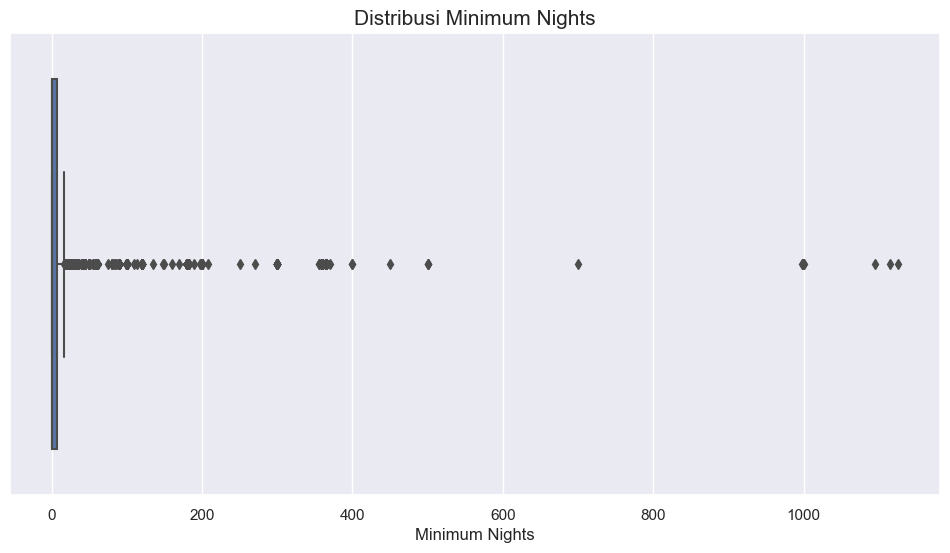

In [355]:

# Creating a boxplot for 'minimum_nights' to visualize the outliers
plt.figure(figsize=(12, 6))

# Generate a boxplot
sns.boxplot(x=data['minimum_nights'])

plt.title('Distribusi Minimum Nights', fontsize=15)
plt.xlabel('Minimum Nights', fontsize=12)

plt.show()


In [356]:
# Kolmogorov-Smirnov test for 'minimum_nights'
ks_test_minimum_nights = stats.kstest(data['minimum_nights'], 'norm')

ks_test_minimum_nights  # Display the test statistic and p-value


KstestResult(statistic=0.8413447460685429, pvalue=0.0, statistic_location=1, statistic_sign=-1)

In [357]:
# count Q1 & Q3 for 'minimum_nights'
Q1_min_nights = data['minimum_nights'].quantile(0.25)
Q3_min_nights = data['minimum_nights'].quantile(0.75)

# Count IQR
IQR_min_nights = Q3_min_nights - Q1_min_nights

# Identify border to detect the outlier
lower_bound_min_nights = Q1_min_nights - 1.5 * IQR_min_nights
upper_bound_min_nights = Q3_min_nights + 1.5 * IQR_min_nights

# Identify outlier
outliers_min_nights = data[(data['minimum_nights'] < lower_bound_min_nights) | (data['minimum_nights'] > upper_bound_min_nights)]

# Summarize the result: IQR, lower bound, upper bound, and total outlier
(IQR_min_nights, lower_bound_min_nights, upper_bound_min_nights, outliers_min_nights['minimum_nights'].count())


(6.0, -8.0, 16.0, 3168)

The 'minimum_nights' column has an Interquartile Range (IQR) of 6.0, with 3168 potential outliers falling outside the bounds of -8.0 and 16.0.
The presence of outliers in the data indicates that these listings have previously been rented and received reviews, suggesting that there are no concerns associated with the owners setting a higher minimum night requirement, and as a result, no corrective actions are required for these outliers.

In [358]:
# Sort the data based on 'minimum_nights' and take the top 5 and bottom 5 data entries
sorted_data = data.sort_values(by='minimum_nights', ascending=True)

# 5 data with lowest 'minimum_nights'
lowest_minimum_nights = sorted_data.head()

# 5 data with highest 'minimum_nights' 
highest_minimum_nights = sorted_data.tail()

(lowest_minimum_nights, highest_minimum_nights) 
display(sorted_data.head(),sorted_data.tail())

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,00-00-0000,0.00,14,365,0
10952,43135436,"🖤CHIC & MODERN , Nana BTS, 5BR, 3R, Near Siam 中文語",221674027,Shirley,Khlong Toei,13.736023,100.554138,Entire home/apt,5886,1,38,2022-12-12 00:00:00,1.16,2,110,33
5870,29042788,"SALA HOSTEL – BTS THONGLO, CITY CLEAR VIEW",218691110,Sala Estate,Vadhana,13.733700,100.584900,Private room,1500,1,1,2018-11-08 00:00:00,0.02,1,365,0
10955,43334791,บริการซักรีดและทำอาหาร,345127017,Hobar,Bangkok Yai,13.740060,100.463600,Private room,575,1,0,00-00-0000,0.00,1,90,0
5868,29040367,4 Bed Dormitory Private - 2 mins walk from BTS,213505793,Natat,Vadhana,13.715790,100.592190,Hotel room,2490,1,1,2019-07-16 00:00:00,0.02,8,365,0


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11243,45051929,Bellevue Boutique Bangkok | Airport Link HUA-MAK,165329146,Sataporn,Suanluang,13.73633,100.63836,Private room,1314,999,0,00-00-0000,0.00,2,181,0
10153,41623113,blossom condo舒适双床房摩天轮夜市周边免费泳池健身房@Sathon surasa...,162537040,Songnya,Sathon,13.71195,100.52055,Entire home/apt,650,1000,2,2020-03-08 00:00:00,0.06,13,179,0
11524,49032568,Freehold Condo near Bangsue Grand Station,4661237,Chayanid,Bang Sue,13.80697,100.52362,Entire home/apt,554,1095,0,00-00-0000,0.00,1,358,0
7986,35165443,Wonderful apartment for you holiday in Thai,86991723,Yang,Bang Na,13.67260,100.60352,Entire home/apt,2000,1115,0,00-00-0000,0.00,2,358,0
61,1041976,Long-stay special rate spacious entire floor Siam,5735895,Pariya,Parthum Wan,13.74814,100.52016,Entire home/apt,2900,1125,295,2021-08-21 00:00:00,2.61,3,0,0


In [359]:
columns_to_process = ['price', 'minimum_nights']

# Define a function to calculate and create the table


def create_outlier_table(df, column):
    # Calculate the lower and upper bounds for outliers using the IQR method
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Count the number of outliers and non-outliers
    outliers = len(df[(df[column] < lower_limit) | (df[column] > upper_limit)])
    no_outliers = len(df[(df[column] >= lower_limit)
                      & (df[column] <= upper_limit)])

    # Determine if the column has outliers
    is_outlier = "Yes" if outliers > 0 else "No"

    # Calculate the percentage of outliers
    outlier_percentage = (outliers / (outliers + no_outliers)) * 100

    return {
        "Column Name": column,
        "Is_Outlier": is_outlier,
        "Lower_Limit": lower_limit,
        "Upper_Limit": upper_limit,
        "Outlier": outliers,
        "Outlier_Percentage": outlier_percentage,
        "No_Outlier": no_outliers,
    }


# Create an empty list to store the outlier information for each column
outlier_info = []

# Iterate through the columns and calculate the outlier information
for column in columns_to_process:
    info = create_outlier_table(data, column)
    outlier_info.append(info)

# Create a DataFrame from the list of outlier information
outlier_table = pd.DataFrame(outlier_info)

# Display the outlier information table
outlier_table

,Column Name,Is_Outlier,Lower_Limit,Upper_Limit,Outlier,Outlier_Percentage,No_Outlier
0,price,Yes,-1393.5,4722.5,1402,8.847659,14444
1,minimum_nights,Yes,-8.0,16.0,3168,19.992427,12678


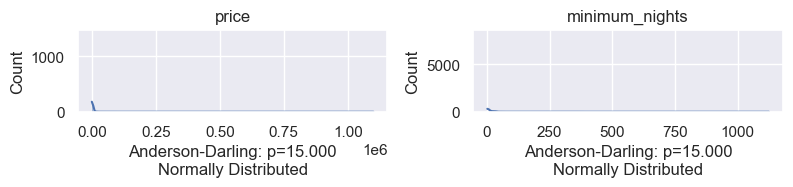

In [360]:
columns = ['price', 'minimum_nights']
#Create a subplot grid
fig, axes = plt.subplots(5, 4, figsize=(16, 8))

#Flatten the axes array for easy iteration
axes = axes.flatten()

#Perform the Anderson-Darling test for each column and create histograms
for i, column in enumerate(columns):
    ax = axes[i]
    sns.histplot(data=data, x=column, kde=True, label=column, ax=ax)
    ax.set_title(column)

    # Perform Anderson-Darling test
    result = stats.anderson(data[column], dist='norm')
    statistic = result.statistic
    critical_values = result.critical_values
    p_values = result.significance_level

    if any(p > 0.05 for p in p_values):
        ax.set_xlabel(
            f"Anderson-Darling: p={max(p_values):.3f}\nNormally Distributed")
    else:
        ax.set_xlabel(
            f"Anderson-Darling: p={min(p_values):.3f}\nNot Normally Distributed")

#Remove any empty subplots
for i in range(len(columns), len(axes)):
    fig.delaxes(axes[i])

#Adjust layout and show the plot
plt.tight_layout()
plt.show()

### 4.4.4 Adding New Variable & Column

In [361]:
def add_area(cols):
    outer = ['Thawi Watthana', 'Taling Chan', 'Nong Khaem', 'Bang Bon', 'Bang Khun thain', 'Don Mueang', 'Lak Si', 'Khlong Sam Wa', 'Nong Chok', 'Min Buri', 'Lat Krabang']
    middle = ['Bang Phlat', 'Bang Khae', 'Phasi Charoen', 'Chom Thong', 'Thung khru', 'Rat Burana', 'Phra Khanong', 'Bang Na', 'Pra Wet', 'Suanluang', 'Bang Kapi', 'Saphan Sung', 'Wang Thong Lang', 'Khan Na Yao', 'Bueng Kum', 'Lat Phrao', 'Bang Khen', 'Sai Mai']
    inner = ['Chatu Chak', 'Bang Sue', 'Phaya Thai', 'Din Daeng', 'Dusit', 'Huai Khwang', 'Vadhana', 'Ratchathewi', 'Parthum Wan', 'Bang Rak', 'Sathon', 'Yan na wa', 'Bang Kho laen', 'Thon buri', 'Bangkok Yai', 'Bangkok Noi', 'Phra Nakhon', 'Pom Prap Sattru Phai', 'Samphanthawong', 'Khlong Toei', 'Khlong San']
    if cols['neighbourhood'] in outer:
        return 'Outer Bangkok'
    elif cols['neighbourhood'] in middle:
        return 'Middle Bangkok'
    elif cols['neighbourhood'] in inner:
        return 'Inner Bangkok'
    else:
        return 'Unknown Zone'

data['area'] = data.apply(add_area, axis=1)
data['area'].unique()

array(['Inner Bangkok', 'Middle Bangkok', 'Outer Bangkok'], dtype=object)

We adding new column to categorize 3 different areas. So we want to make it easier to separates the area.

### 4.4.5 Extract Clean Data to CSV

In [362]:
data.to_csv('Airbnb Listings Bangkok Cleaned.csv',index=False)

# <strong> 5. Data Analysis

In [363]:
data['area'].unique()

array(['Inner Bangkok', 'Middle Bangkok', 'Outer Bangkok'], dtype=object)

In [364]:
# Selecting only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Now, calculate correlation on this filtered data
corr = numeric_data.corr(method='spearman')


In [365]:
data['price_per_night']=data['price']/data['minimum_nights']

In [366]:
#Displaying properties with prices above the maximum reasonable price per night.
max_price=data[data['price']>46524]
# display(max_price)
print(f'The number of properties that have prices above the maximum reasonable price per night is {len(max_price)}')

The number of properties that have prices above the maximum reasonable price per night is 63


### 5.1 Correlation between columns

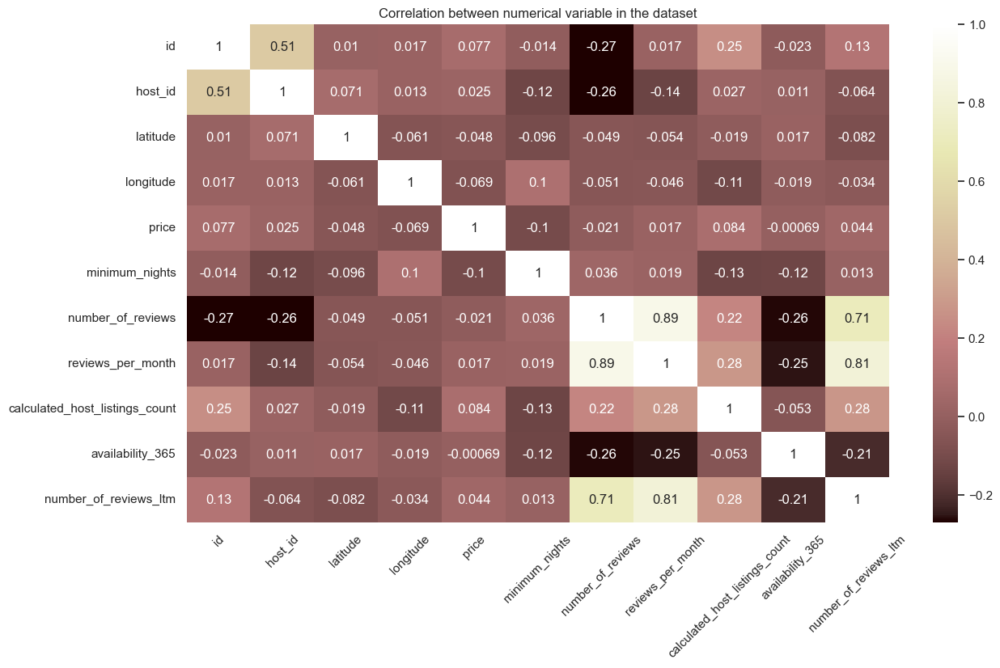

In [367]:
corr = numeric_data.corr(method='spearman')
plt.figure(figsize=(14,8))
sns.heatmap(corr, annot=True, cmap='pink')  # Note the lowercase 'p' in 'pink'

plt.xticks(rotation=45)
plt.title("Correlation between numerical variable in the dataset")

plt.show()



Inter-variable Relationships:

* Variables with strong positive or negative correlations affect each other. For instance, if `reviews_per_month` and `number_of_reviews` are strongly correlated, it suggests that listings with more reviews tend to have higher monthly reviews, a logical assumption since more activity generally means more reviews.

* If a variable, say `price`, has multiple strong correlations with several other features, it could be a key influencing factor within the dataset. For instance, if higher prices correlate with negative reviews but correlate positively with amenities or square footage, it suggests a trade-off that customers make between price and comfort or luxury.


### 5.2 Analyzing Listings

In [368]:
# Path to GJSON
geojson_path = 'Bangkok-districts.geojson'  # Ganti dengan path aktual Anda jika berbeda

# Read GeoJSON file
with open(geojson_path, 'r', encoding='utf-8') as file:
    geojson_content = json.load(file)

# Create Basic Map
map_bangkok = folium.Map(location=[13.736717, 100.523186], zoom_start=10)

# Add Layer GeoJSON
folium.GeoJson(geojson_content, name="districts").add_to(map_bangkok)

# Function for categories the color
def color_producer(area):
    if area == "Inner Bangkok":
        return 'red'
    elif area == "Middle Bangkok":
        return 'blue'
    else:
        return 'green'

# Add Marker
for idx, row in data.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']), 
        radius=3, 
        color=color_producer(row['area']),
        fill=True,
        fill_opacity=0.6
    ).add_to(map_bangkok)


map_bangkok



`Inner Bangkok`:
Highly dense downtown area.
Home to the majority of businesses, shopping centers, and tourist attractions.
Advanced infrastructure and highest living costs.<br>
`Middle Bangkok`:
Transition zone with a mix of residential and commercial areas.
Good infrastructure but less compared to Inner Bangkok.
Moderate living costs with a variety of services and amenities.<br>
`Outer Bangkok`:
Suburbs and semi-rural areas.
More limited infrastructure connections and a quieter atmosphere.
Most affordable living costs and closer to nature.

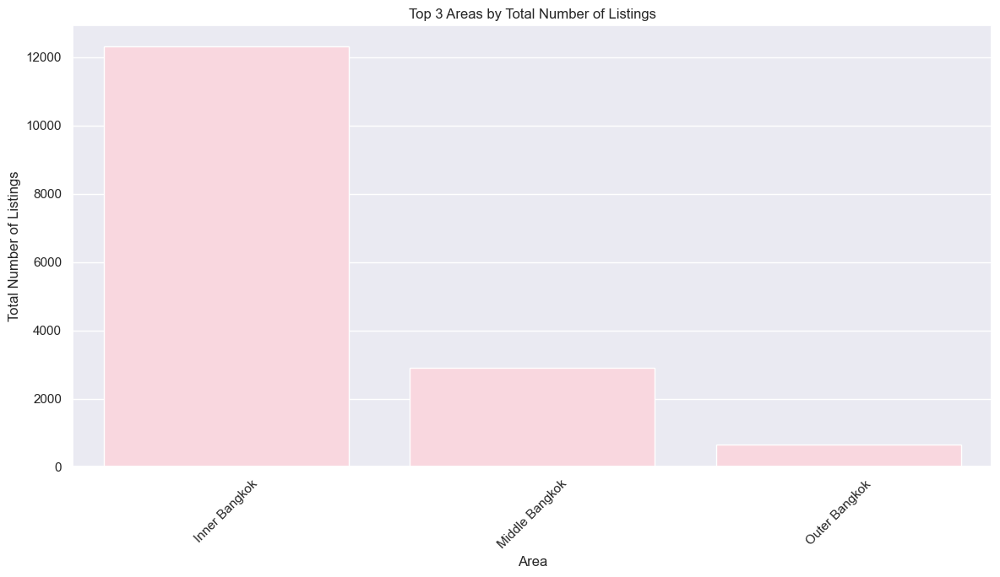

In [369]:
# First, we'll group by 'area' and count the number of listings instead of summing the reviews.
popular_areas_corrected = data.groupby('area').agg(
    total_listings=pd.NamedAgg(column='id', aggfunc='count')  # assuming 'listing_id' identifies unique listings
).reset_index()

# Sorting the areas based on total listings
popular_areas_sorted_corrected = popular_areas_corrected.sort_values(by='total_listings', ascending=False)

# Creating the visualization: Top 3 areas based on total number of listings
plt.figure(figsize=(12, 7))

# Defining the pastel pink color
pink_pastel = '#FFD1DC'

# Using the pastel pink color and limiting the plot to the top 3 areas for clarity, as indicated in the title
sns.barplot(
    x='area', 
    y='total_listings', 
    data=popular_areas_sorted_corrected.head(3),  # limiting the data to top 3
    palette=[pink_pastel]  # using pink pastel color
)

plt.title('Top 3 Areas by Total Number of Listings')
plt.xlabel('Area')
plt.ylabel('Total Number of Listings')
plt.xticks(rotation=45)  # Rotating the x-axis labels for better readability

# Show the plot with the corrected data
plt.tight_layout()
plt.show()

<strong> Insight:<br>
* Based on data above, Inner Bangkok area has dominant `Number of Listings`
* `Inner Bangkok` contains neighbourhoods: Chatu Chak, Bang Sue, Phaya Thai, Din Daeng, Dusit, Huai Khwang, Vadhana, Ratchathewi, Parthum Wan, Bang Rak, Sathon, Yan na wa, Bang Kho laen, Thon buri, Bangkok Yai, Bangkok Noi, Phra Nakhon, Pom Prap Sattru Phai, Samphanthawong, Khlong Toei, Khlong San
* The areas with the most listings likely correlate with high traffic, suggesting these are popular choices among travelers. This could be due to various factors such as location convenience, attraction points, or quality of the listings.


In [370]:
area_data = data['area'].value_counts().reset_index().rename(columns={'count':'listing'})
area_data

,area,listing
0,Inner Bangkok,12308
1,Middle Bangkok,2891
2,Outer Bangkok,647


### 5.3. Analyzing Each Room Type


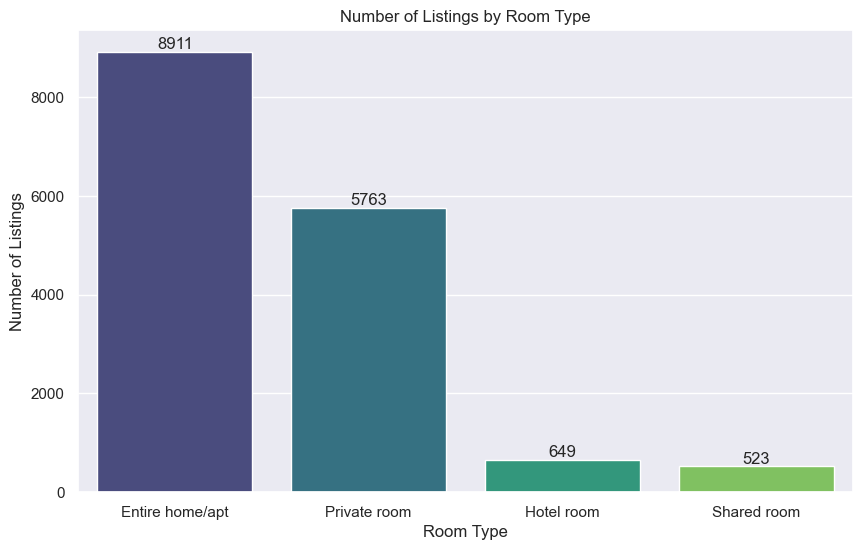

In [371]:
# Calculate the number of listings for each 'room_type'
room_counts = data.groupby('room_type').size().reset_index(name='count')  # Replace 'room_type' and 'count' if using different names

# Sort the data based on 'count' in descending order (from the most to the fewest listings)
sorted_room_counts = room_counts.sort_values('count', ascending=False)

# Create a bar plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=sorted_room_counts, x='room_type', y='count', palette='viridis')

# Adding title and labels
plt.title('Number of Listings by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')

# Adding labels to each bar with their counts
container = ax.containers[0]
ax.bar_label(container)

# Display the plot
plt.show()

In [372]:
# Grouping the data by 'area' and then 'room_type' to count the number of listings
room_counts = data.groupby(['area', 'room_type']).size().reset_index(name='counts')

# Display the first few rows of the dataframe
room_counts



,area,room_type,counts
0,Inner Bangkok,Entire home/apt,7169
1,Inner Bangkok,Hotel room,584
2,Inner Bangkok,Private room,4107
3,Inner Bangkok,Shared room,448
4,Middle Bangkok,Entire home/apt,1542
5,Middle Bangkok,Hotel room,36
6,Middle Bangkok,Private room,1266
7,Middle Bangkok,Shared room,47
8,Outer Bangkok,Entire home/apt,200
9,Outer Bangkok,Hotel room,29


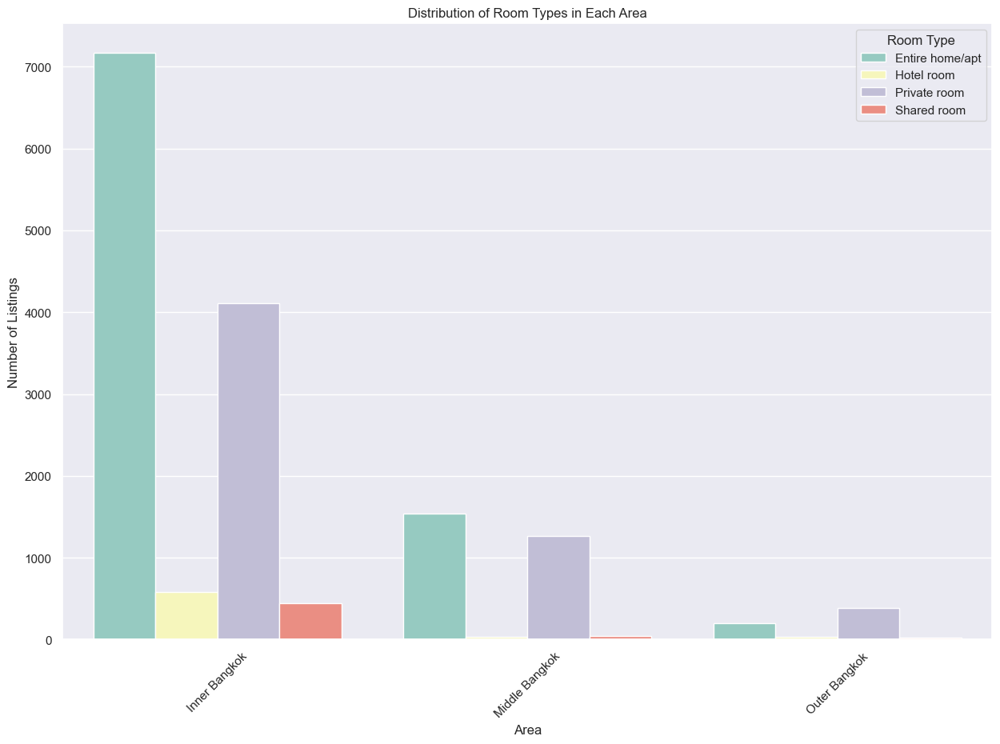

In [373]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))

# Create a bar chart, stacked by room type for each area
sns.barplot(x='area', y='counts', hue='room_type', data=room_counts, palette='Set3')

plt.title('Distribution of Room Types in Each Area')
plt.xlabel('Area')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45)
plt.legend(title='Room Type')

plt.show()


In [374]:
# Menghitung Jumlah Ruangan Berdasarkan room_type nya
data_RT = data['room_type'].value_counts()
data_RT = pd.DataFrame(data_RT).reset_index()

# Membuat persentase setiap room_type
data_RT['persentase'] = data_RT['count'] / data_RT['count'].sum() * 100
data_RT

,room_type,count,persentase
0,Entire home/apt,8911,56.235012
1,Private room,5763,36.368800
2,Hotel room,649,4.095671
3,Shared room,523,3.300517


### 5.4 Analyzing the Price


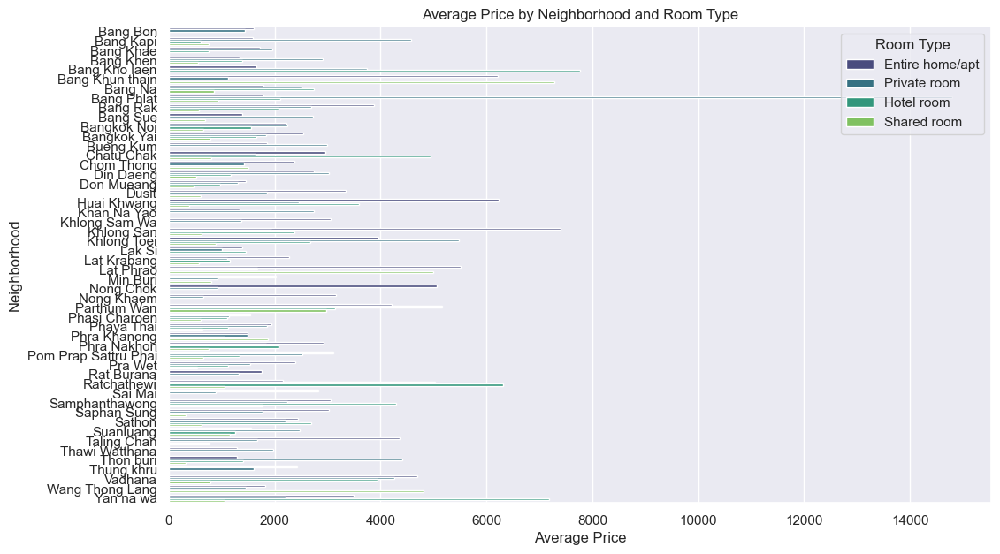

In [375]:
# Group the data by 'neighbourhood', 'room_type', and calculate the mean price
price_by_neighborhood_roomtype = data.groupby(['neighbourhood', 'room_type'])['price'].mean().reset_index()

# Create a vertical bar plot to visualize the average price by neighborhood and room type
plt.figure(figsize=(12, 7))
sns.barplot(data=price_by_neighborhood_roomtype, x='price', y='neighbourhood', hue='room_type', palette='viridis')
plt.title('Average Price by Neighborhood and Room Type')
plt.ylabel('Neighborhood')
plt.xlabel('Average Price')

# Display the plot
plt.legend(title='Room Type')
plt.show()

We can easily compare the average prices of different room types within each neighborhood in Bangkok. It provides insights into the relative pricing of room types in various neighborhoods. The visualization reveals distinct pricing trends, with some neighborhoods commanding higher average prices for certain room types. For instance, 'Entire homes/apts' generally fetch higher prices across all neighborhoods, consistent with market expectations of privacy and space.

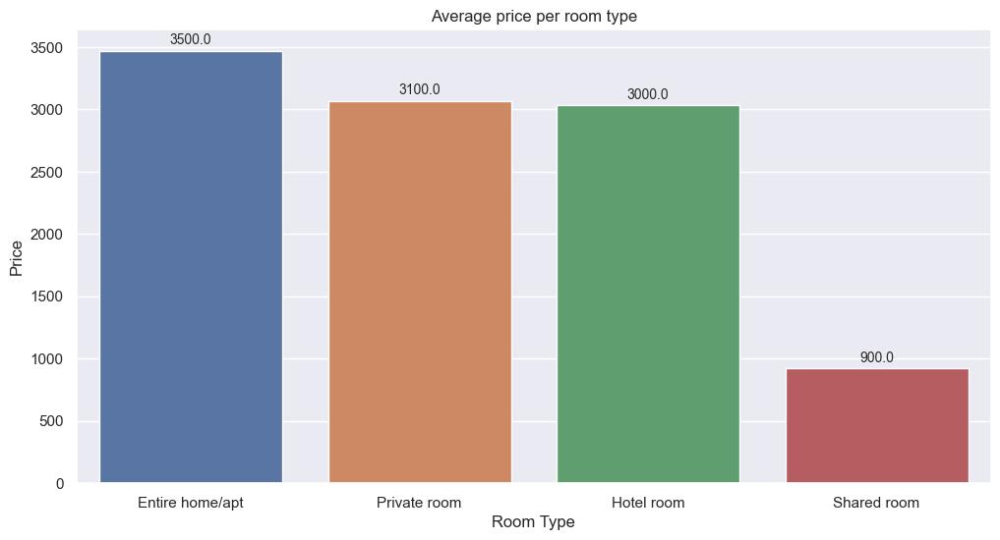

In [376]:
plt.figure(figsize=(12,6));
sns.set_theme()
ax = sns.barplot(data=data,
            x='room_type',
            y='price',
            estimator=np.mean,
            ci=0);
for bar in ax.patches:
    ax.annotate(format(round(bar.get_height(), -2)),
                   (bar.get_x() + bar.get_width() / 2,
                   bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
plt.xlabel('Room Type')
plt.ylabel('Price')
plt.title('Average price per room type');

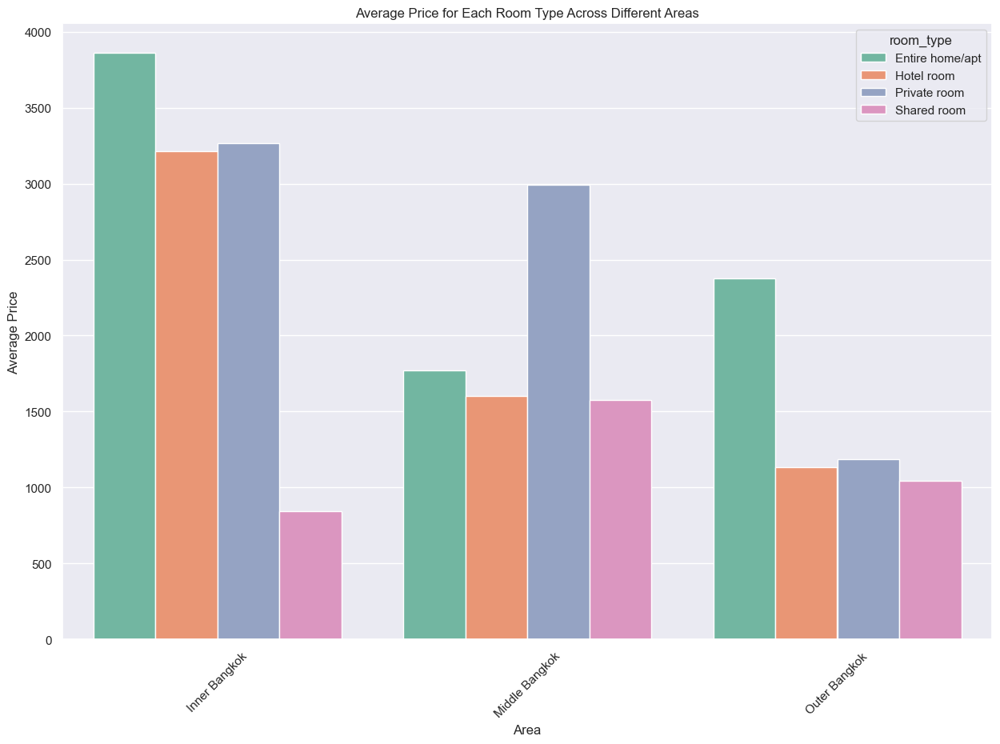

In [377]:
# Calculating the mean prices
mean_prices = data.groupby(['area', 'room_type'])['price'].mean().reset_index()

plt.figure(figsize=(15, 10))
sns.barplot(x='area', y='price', hue='room_type', data=mean_prices, palette="Set2")
plt.title('Average Price for Each Room Type Across Different Areas')
plt.xlabel('Area')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()


In [378]:
# Summary statistics for price by room type and area
summary = data.groupby(['area', 'room_type'])['price'].describe()
print(summary)


                                 count         mean           std    min  \
area           room_type                                                   
Inner Bangkok  Entire home/apt  7169.0  3860.070721  33494.952336  332.0   
               Hotel room        584.0  3212.787671  12651.036559  318.0   
               Private room     4107.0  3267.455807  15619.901266  300.0   
               Shared room       448.0   843.477679   2041.854295  280.0   
Middle Bangkok Entire home/apt  1542.0  1772.791180   2733.232011  337.0   
               Hotel room         36.0  1600.361111   1041.370694  350.0   
               Private room     1266.0  2992.522907  23889.395147  278.0   
               Shared room        47.0  1573.680851   2747.364746  280.0   
Outer Bangkok  Entire home/apt   200.0  2376.970000   2902.844412  360.0   
               Hotel room         29.0  1135.206897    554.597111  595.0   
               Private room      390.0  1187.125641   1107.095824  310.0   
            

The data indicates a significant disparity in accommodation prices and availability across Bangkok, with Inner Bangkok featuring the highest average prices and greatest variability (especially in the 'Entire home/apt' category, likely due to a mix of luxury and standard offerings). In contrast, Middle and Outer Bangkok offer more affordable options, but with a stark decrease in the number of listings. The 'Shared room' category is the most economical choice across all regions, but it's also the least available, indicating less demand or fewer listings in this category. The substantial standard deviations, particularly in Inner and Middle Bangkok, suggest a wide range of accommodation standards and prices, catering to diverse tourist demographics and preferences. This variation presents opportunities for market segmentation and targeted service enhancements, especially for areas outside the central region, which currently see less traffic and lower prices, potentially reflecting underutilized market segments.

# 6. Conclusion

Across all regions, the interplay of location, room type, and price point is evident. Travelers' choices hinge on their priorities, budget, and the kind of experience they seek. Hosts, therefore, need to strategically position their listings by emphasizing the unique aspects of their properties, localities, and the experiences they curate.The variety in room types, possibly more diverse, caters to a broader audience, including families, groups, and long-term travelers.

* Inner:
This area has the highest number of listings, especially for 'Entire homes/apts' and 'Private rooms'. The prices are also significantly higher here, with 'Entire homes/apts' having a particularly wide range, indicated by a high standard deviation. This suggests a mix of both luxury accommodations and standard options. 'Shared rooms' are the cheapest, but also quite varied in price.

* Middle:
Fewer listings are available in this area, with 'Entire homes/apts' and 'Private rooms' still the most popular. The prices are generally lower than in Inner Bangkok, with less variability, suggesting more uniformity in the types of accommodations available.

* Outer:
This area has the fewest listings, indicating it's the least popular for rentals. The prices, especially for 'Hotel rooms' and 'Private rooms', are the lowest among all regions, suggesting this area might offer the most budget-friendly options. The 'Entire homes/apts' category, while priced higher, is still more affordable compared to Inner or Middle Bangkok.

In all areas, 'Entire home/apt' is the most prevalent type of listing and tends to be more expensive on average, likely due to the additional space and privacy. 'Shared rooms' are consistently the least expensive. The standard deviations suggest a wide range of prices within each category, likely reflecting a diverse range of accommodation standards.

# 7. Recommendation

Based on the data analysis, here are some recommendations for different stakeholders involved in the Airbnb market in Bangkok:

`For Airbnb Hosts/Property Owners`:<br>

* Diversify Offerings: Hosts in Inner Bangkok, where rental prices are highest, could consider diversifying their offerings. Since there's a wide range in prices, introducing more budget-friendly options could attract a broader audience.
* Competitive Pricing: Those in Middle and Outer Bangkok should keep pricing competitive to attract more guests. Offering unique experiences or perks could justify higher prices.
* Enhance Shared Spaces: Considering 'Shared rooms' are the least expensive, hosts could enhance these spaces to improve the guest experience without significantly raising costs, potentially increasing the demand.<br>

`For Airbnb Management/Platform`:

* Dynamic Pricing Tools: Implement or improve dynamic pricing tools that help hosts optimize their pricing based on market demand, time of year, and other factors. This helps in maintaining a healthy balance between affordability for guests and profitability for hosts.
* Targeted Marketing: Conduct targeted marketing campaigns to promote lesser-known areas. Highlighting the attractions of Middle and Outer Bangkok could distribute tourist traffic more evenly and increase bookings there.
* Quality Standards: Establish clear quality standards for listings, especially since the high standard deviation suggests varying accommodation standards. This ensures guest satisfaction and consistency in what they can expect from a listing.

`For Investors`:<br>

* Market Analysis for Investment: Investors should consider the popularity and price ranges of different areas and room types when investing in properties. Inner Bangkok may offer high returns but also comes with high variability, whereas Outer and Middle Bangkok could present more stable, albeit potentially lower, returns.
* Emerging Opportunities: Keep an eye on development plans or tourism projects in Middle and Outer Bangkok, as these could increase property values and demand in the future.